#I have uploaded the dataset into google drive, You can also upload it directly to google colab or use locally with jupyter notebook.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
## Unzipping the files and extracting all the folders

!unzip "/content/drive/MyDrive/Datasets/wheat spike detection/global-wheat-detection.zip"

Archive:  /content/drive/MyDrive/Datasets/wheat spike detection/global-wheat-detection.zip
  inflating: sample_submission.csv   
  inflating: test/2fd875eaa.jpg      
  inflating: test/348a992bb.jpg      
  inflating: test/51b3e36ab.jpg      
  inflating: test/51f1be19e.jpg      
  inflating: test/53f253011.jpg      
  inflating: test/796707dd7.jpg      
  inflating: test/aac893a91.jpg      
  inflating: test/cb8d261a3.jpg      
  inflating: test/cc3532ff6.jpg      
  inflating: test/f5a1f0358.jpg      
  inflating: train.csv               
  inflating: train/00333207f.jpg     
  inflating: train/005b0d8bb.jpg     
  inflating: train/006a994f7.jpg     
  inflating: train/00764ad5d.jpg     
  inflating: train/00b5c6764.jpg     
  inflating: train/00b5fefed.jpg     
  inflating: train/00b70a919.jpg     
  inflating: train/00e903abe.jpg     
  inflating: train/00ea5e5ee.jpg     
  inflating: train/010b216d4.jpg     
  inflating: train/010c93b99.jpg     
  inflating: train/010dbcc8f.jpg   

In [3]:
import os
import pandas as pd

#Setting up paths

train_path = "/content/train/"
test_path = "/content/test"

print("Number of images to train are : {}".format(len(os.listdir(train_path))))
print("Number of images to test are : {}".format(len(os.listdir(test_path))))


Number of images to train are : 3422
Number of images to test are : 10


In [4]:
df = pd.read_csv("/content/train.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   image_id  147793 non-null  object
 1   width     147793 non-null  int64 
 2   height    147793 non-null  int64 
 3   bbox      147793 non-null  object
 4   source    147793 non-null  object
dtypes: int64(2), object(3)
memory usage: 5.6+ MB


## As you can see from above we have total of atleast 1 million bounding boxs for images but we have only 3422. So we need to extract only bounding boxes for respective image id we have in the training set

In [5]:

#Extracting images file name from training set
images = []
for i in os.listdir(train_path):
  j = i.split(".")[0]
  images.append(j)

training_images = pd.DataFrame(images, columns=["image_id"])
training_images.head(5)


,image_id
0,6d1ff0f34
1,ed168fff1
2,a39887dc2
3,aa6b16251
4,8b342101d


In [6]:
#Merging all the images in training set to have their bounding boxes

training_images = training_images.merge(df, on="image_id", how= 'left')
training_images.head(5)


,image_id,width,height,bbox,source
0,6d1ff0f34,1024.0,1024.0,"[597.0, 945.0, 120.0, 74.0]",rres_1
1,6d1ff0f34,1024.0,1024.0,"[587.0, 854.0, 76.0, 74.0]",rres_1
2,6d1ff0f34,1024.0,1024.0,"[256.0, 915.0, 70.0, 109.0]",rres_1
3,6d1ff0f34,1024.0,1024.0,"[307.0, 917.0, 64.0, 107.0]",rres_1
4,6d1ff0f34,1024.0,1024.0,"[202.0, 815.0, 55.0, 57.0]",rres_1


In [7]:
print("Number of images with no bounding boxs {}".format(len(training_images)- len(df)))


Number of images with no bounding boxs 49


## As you can see from above there are 49 images with no bounding boxes

In [8]:
import numpy as np
#filling zero's if there are any nan values

training_images["bbox"].fillna('[0,0,0,0]')
temp_df = training_images

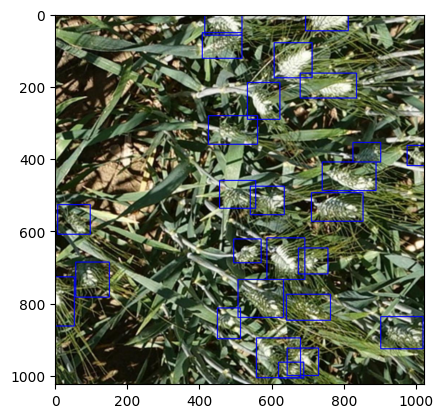

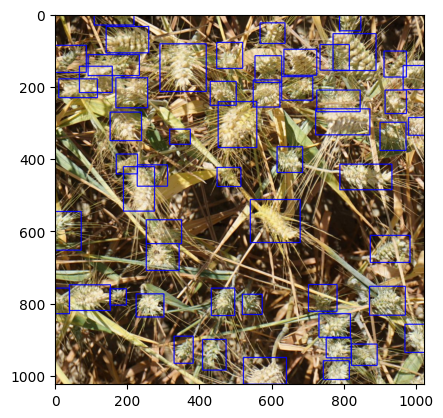

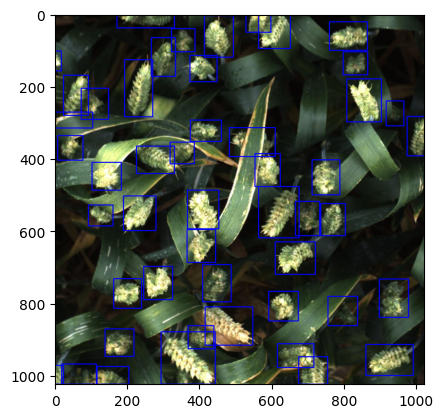

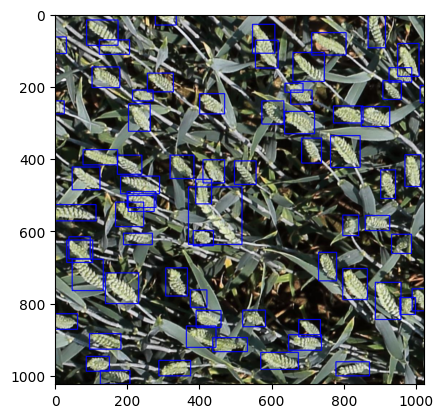

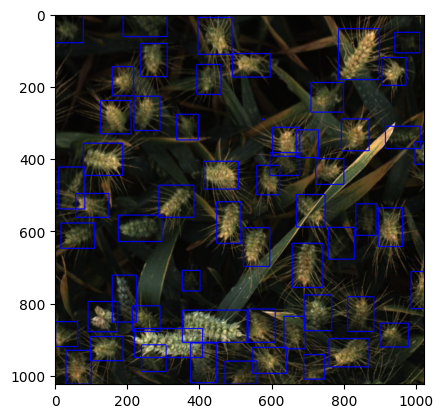

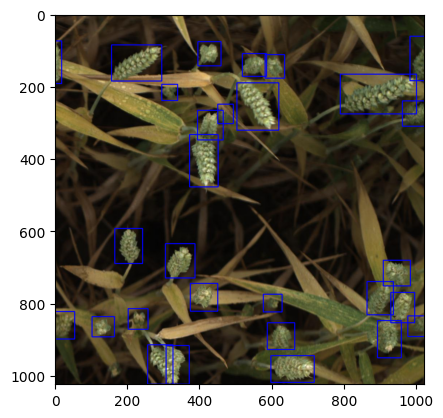

In [9]:
import cv2
import matplotlib.pyplot as plt
import ast


#Visualizing an image

i_list = [ 100, 297, 2500, 1321, 794, 10]

for g in i_list :
  img =cv2.imread( train_path + training_images["image_id"][g] + ".jpg")

  img_name =training_images.iloc[g]["image_id"]

  same_image_boxes = training_images[training_images["image_id"] == img_name]["bbox"]

  for i in same_image_boxes:
    bbox_list = ast.literal_eval(i)
    number_list = [float(s) for s in bbox_list]
    x,y,w,h = map(int, number_list)
    cv2.rectangle(img, (x,y), (x+w,y+h), (255,0,0), 2)
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)

  plt.show()

### As you can see the label's there are many bounding box's for each image and also with different brightness

In [10]:
# Counting number of bounding boxes for images

bbox_count = {}
unique_images = training_images["image_id"].unique()

for i in unique_images:
  num_bbox = training_images[i == training_images["image_id"] ]["bbox"]
  bbox_count[i] = num_bbox.count()


bbox_count

{'6d1ff0f34': 29,
 'ed168fff1': 55,
 'a39887dc2': 26,
 'aa6b16251': 58,
 '8b342101d': 42,
 'ba35357cb': 79,
 '63c658201': 55,
 '4ef7057d7': 46,
 'a700357af': 49,
 'e4cc39cbf': 32,
 'd4811c163': 8,
 'ab23f5b74': 61,
 'a2e7fd80f': 56,
 '5f9151e33': 18,
 '227971e53': 22,
 '9561a71a0': 38,
 'af32eb10c': 20,
 '9c05c8d56': 67,
 '229716799': 58,
 '4e9096ca9': 44,
 'aff4e0a02': 44,
 '877827fb3': 44,
 '4fbf0c8b7': 29,
 'd7a02151d': 30,
 'b20d35e4d': 53,
 'cf3ebbedd': 64,
 '4e2b8a4a6': 77,
 'd9b373de2': 53,
 'a764cea1f': 32,
 'b1c1aade8': 24,
 'e67200e55': 71,
 'a94964eda': 53,
 '00b5fefed': 25,
 '50c47d6b5': 88,
 '66d517e44': 35,
 '817ab3693': 16,
 '96fa00d50': 46,
 'b0a8fcaf8': 84,
 '0c3d9007c': 19,
 '1eb2bad31': 59,
 '060c572e4': 72,
 '630b12b1a': 32,
 '522edf5c3': 34,
 '3fa57b900': 59,
 'af14863c5': 73,
 '52c1231da': 72,
 'ad62f80f2': 55,
 '6ca4eaf5b': 25,
 '037024e13': 43,
 'b6ab77fd7': 47,
 'ef0a4ba44': 7,
 '46e976dc4': 35,
 'def999c42': 55,
 '00b5c6764': 0,
 '7c7d269c8': 73,
 '93d056da6':

# Statistics of Bounding Box's

In [11]:
print("Number of images {}".format(len(bbox_count)))


print("Total count bounding box's {}".format(sum(bbox_count.values())))


print("Highest number of bounding box's in an image {}".format(max(bbox_count.values())))


print("Lowest number of bounding box's in an image {}".format(min(bbox_count.values())))


print("Average number of bounding box's in an image {}".format(float(sum(bbox_count.values())/float(len(bbox_count)))))



Number of images 3422
Total count bounding box's 147793
Highest number of bounding box's in an image 116
Lowest number of bounding box's in an image 0
Average number of bounding box's in an image 43.18907071887785


In [12]:
import operator
#top 3
highest = sorted(bbox_count.items(), key=operator.itemgetter(1), reverse=True)[:3]
print(highest)
#lowest 3
lowest = sorted(bbox_count.items(), key=operator.itemgetter(1))[50:]
unique_values = set()
lowest_three_unique = []

for item in lowest:
    if item[1] not in unique_values:
        unique_values.add(item[1])
        lowest_three_unique.append(item)
    if len(lowest_three_unique) == 3:
        break

print("Three lowest unique values:", lowest_three_unique)

[('35b935b6c', 116), ('f1794c924', 108), ('f79336a8e', 104)]
Three lowest unique values: [('22f341965', 1), ('14716eed5', 2), ('708553a80', 3)]


##Plotting highest count bounding boxs

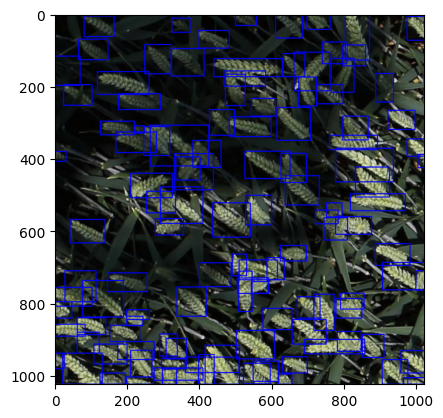

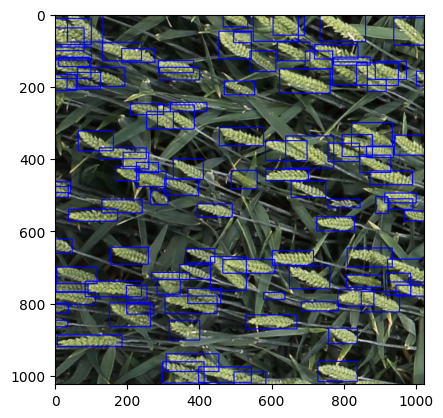

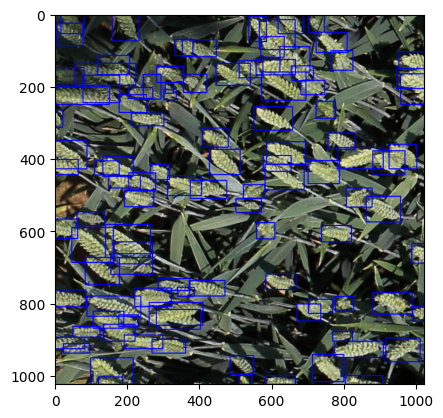

In [13]:


for g in highest :
  img =cv2.imread( train_path + g[0] + ".jpg")

  img_name =g[0]

  same_image_boxes = training_images[training_images["image_id"] == img_name]["bbox"]

  for i in same_image_boxes:
    bbox_list = ast.literal_eval(i)
    number_list = [float(s) for s in bbox_list]
    x,y,w,h = map(int, number_list)
    cv2.rectangle(img, (x,y), (x+w,y+h), (255,0,0), 2)
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)

  plt.show()

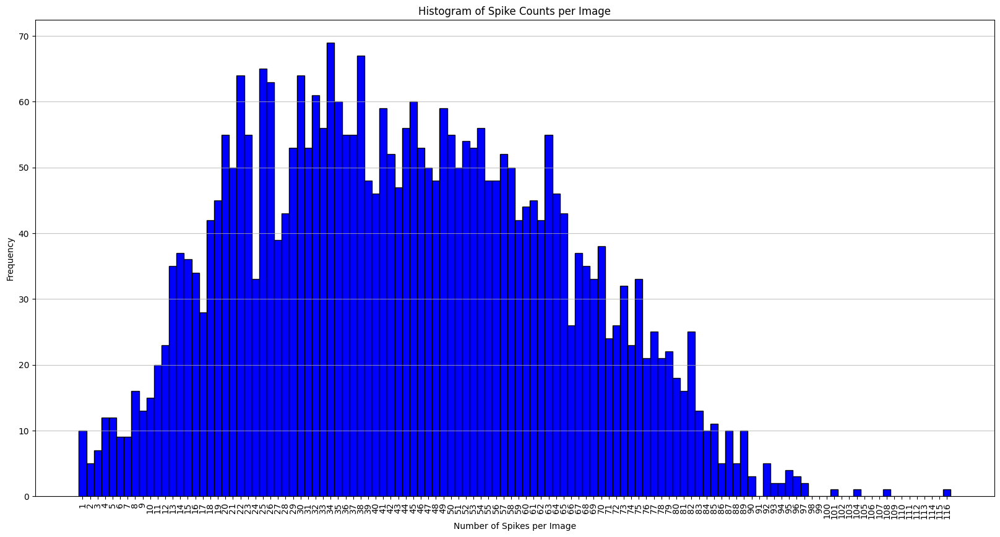

In [14]:
import matplotlib.pyplot as plt

spike_counts = list(bbox_count.values())
plt.figure(figsize=(20,10))

# Plot the histogram of spike counts
plt.hist(spike_counts, bins=range(1, max(spike_counts) + 2), align='left', color='blue', edgecolor='black')

plt.title('Histogram of Spike Counts per Image')
plt.xlabel('Number of Spikes per Image')
plt.ylabel('Frequency')

plt.xticks(range(1, max(spike_counts) + 1),rotation = 90)  # Set x-ticks to be every spike count
plt.grid(axis='y', alpha=0.75)

plt.show()


### As you can see most of the spikes in an images are present between 20 and 65

##Plotting lowest count bounding boxs

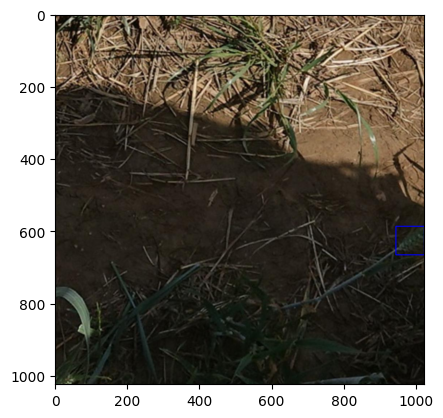

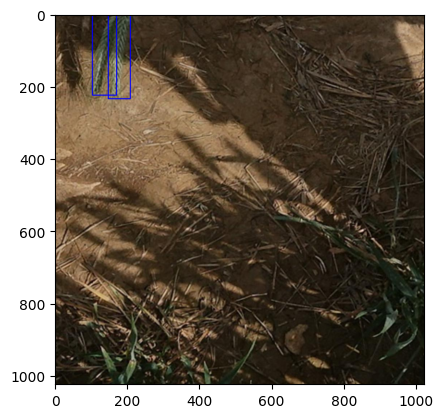

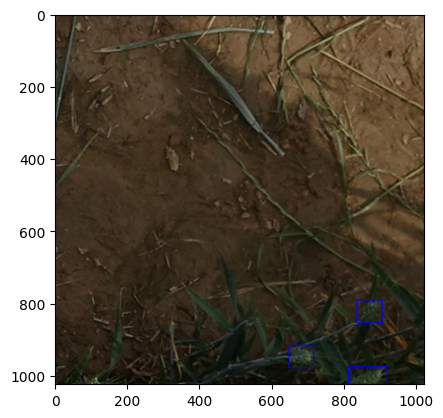

In [15]:


for g in lowest_three_unique :
  img =cv2.imread( train_path + g[0] + ".jpg")

  img_name =g[0]

  same_image_boxes = training_images[training_images["image_id"] == img_name]["bbox"]

  for i in same_image_boxes:
    bbox_list = ast.literal_eval(i)
    number_list = [float(s) for s in bbox_list]
    x,y,w,h = map(int, number_list)
    cv2.rectangle(img, (x,y), (x+w,y+h), (255,0,0), 2)
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)

  plt.show()

## If you look at the highest and lowest number of spikes, you can clearly tell we need more of highest number of spikes. Because it gives us more information.

## Now we want to check how large is our bounding box

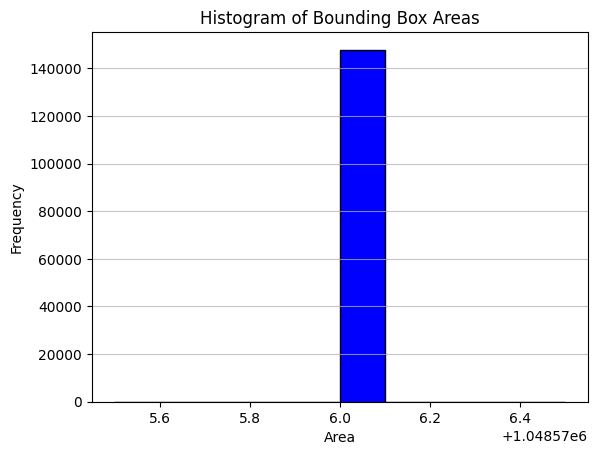

In [16]:
training_images['area'] = training_images['height']* training_images['width']

plt.hist(training_images['area'], bins=10, color='blue', edgecolor='black')
plt.title('Histogram of Bounding Box Areas')
plt.xlabel('Area')
plt.ylabel('Frequency')

plt.grid(axis='y', alpha=0.75)
plt.show()


In [17]:
print("Maximum area of bounding box {}".format( training_images.area.max()))

print("Minimum area of bounding box {}".format( training_images.area.min()))


Maximum area of bounding box 1048576.0
Minimum area of bounding box 1048576.0


### As you see from above , Graph and statistics, Max and minimum area of bounding box's are same which means all bounding box's are of same size for all images.

## As , We already explained before we need as many bounding box's as much possible in an image, for that we would like to draw the  distribution of number of spikes in an image.

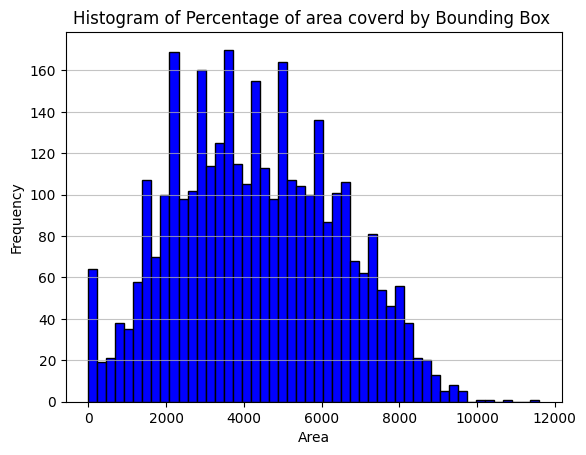

In [18]:
area_per_image = training_images.groupby(by='image_id').sum().reset_index()

area_per_image_percentage = area_per_image.copy()
area_per_image_percentage['bbox_area'] = area_per_image_percentage['area'] / (1024*1024) * 100

plt.hist(area_per_image_percentage['bbox_area'], bins=50, color='blue', edgecolor='black')
plt.title('Histogram of Percentage of area coverd by Bounding Box ')
plt.xlabel('Area')
plt.ylabel('Frequency')

plt.grid(axis='y', alpha=0.75)
plt.show()

###

1.   As you see  above plot, we have a good normal distribution with 20% - 40% of image is covered with bounding boxs.
2.   This plot also tells us that the resulting bounding box's which are predicted box's should also have the similar distribution.



## As you know , we have small number of training examples. Hence, we will use augmentation techniques to increase our dataset.

#Augmentation :
So data augmentation can really help build strong models even with what we have. Some things that could work are flipping images upside down and side to side since the orientation of pictures varies. Crop and resize may also help since spikes appear at different magnifications. Applying different filters to adjust lighting is a good idea too.

We do need to be careful of one thing though - rotation likely won't work well. Spinning the images around could really mess with how the bounding boxes are drawn on everything. But flipping, resizing and filters should provide more diversity to train on.

In [19]:
import imgaug.augmenters as iaa

# Defining augmentations
seq = iaa.Sequential([
    iaa.Fliplr(0.5),  # horizontal flips with 50% probability
    iaa.Flipud(0.2),  # vertical flips with 20% probability
    iaa.Crop(percent=(0, 0.1)),  # random crops from 0% to 10% of the image height/width
    # Scale the images to 80-120% of their size, individually per axis
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}
    ),
    # Change brightness (50-150% of the original value)
    iaa.Multiply((0.5, 1.5)),
])


print(train_path)

/content/train/


In [20]:
images = [cv2.imread(train_path+"/"+image_path) for image_path in os.listdir(train_path)]


## Applying Augmentation

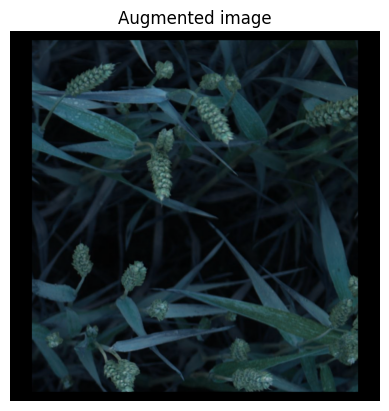

In [21]:
images_aug = seq(images=images[ :50])  # Apply augmentations
plt.imshow(images_aug[0])
plt.title("Augmented image")
plt.axis("off")
plt.show()



### But there are no bounding boxs

In [22]:
import pandas as pd
import numpy as np
import cv2
import os
import imgaug as ia
import imgaug.augmenters as iaa
import ast

# Load your DataFrame
training_images = temp_df

# Define your augmentations
seq = iaa.Sequential([
    iaa.Fliplr(0.5),  # horizontal flips with 50% probability
    iaa.Flipud(0.2),  # vertical flips with 20% probability
    iaa.Crop(percent=(0, 0.1)),  # random crops from 0% to 10% of the image height/width
    # Scale the images to 80-120% of their size, individually per axis
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}
    ),
    # Change brightness (50-150% of the original value)
    iaa.Multiply((0.5, 1.5)),
    ])

In [23]:

# Group by image_id and aggregate all bboxes into a list, filtering out NaN values
grouped = training_images.groupby('image_id')['bbox'].agg(lambda x: [str(i) for i in x if pd.notna(i)]).reset_index()

images = []
bbs_on_images = []
count = 0

for _, row in grouped.iterrows():
    image_path = os.path.join(train_path, f"{row['image_id']}.jpg")
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image at {image_path} could not be read.")
        continue

    bboxes = [ast.literal_eval(bbox_str) for bbox_str in row['bbox'] if bbox_str != 'nan']
    bounding_boxes = [ia.BoundingBox(x1=bb[0], y1=bb[1], x2=bb[0]+bb[2], y2=bb[1]+bb[3]) for bb in bboxes]
    bbs_on_image = ia.BoundingBoxesOnImage(bounding_boxes, shape=image.shape)

    images.append(image)
    bbs_on_images.append(bbs_on_image)
    if count == 3000:
        break
    count = count +1



# Apply augmentations to images and bounding boxes
images_aug, bbs_aug = seq(images=images[:3000], bounding_boxes=bbs_on_images[:3000])



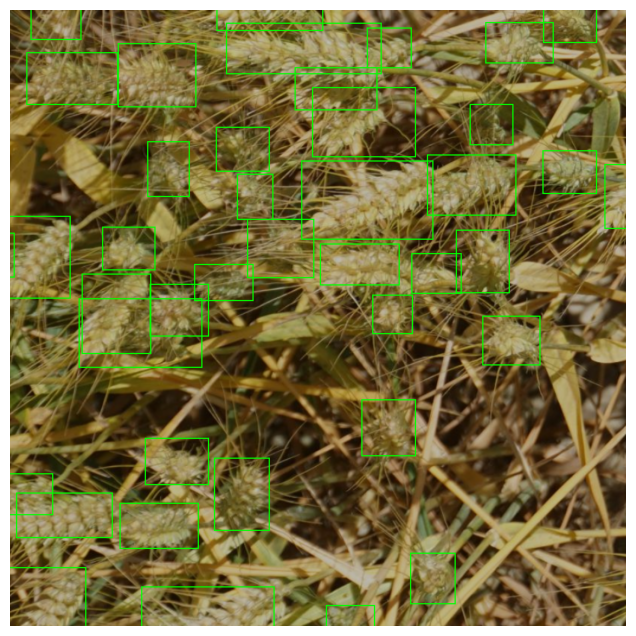

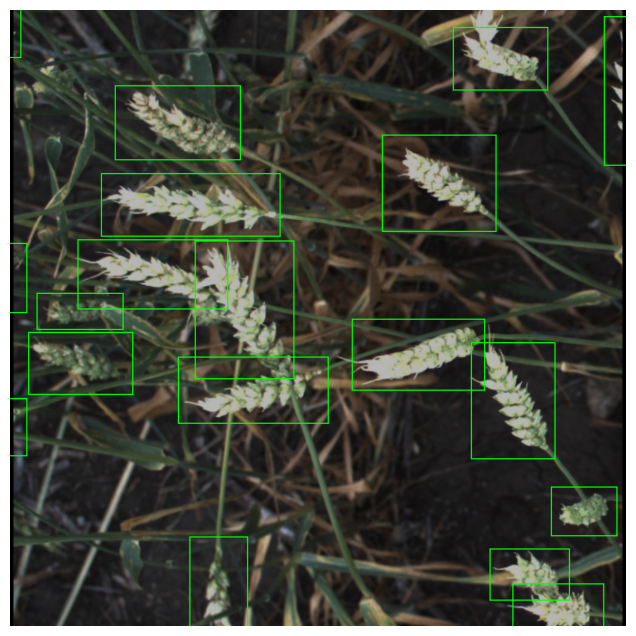

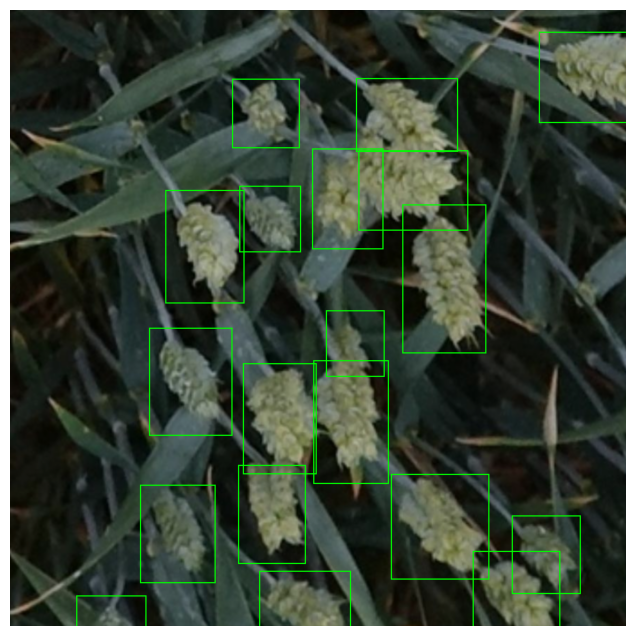

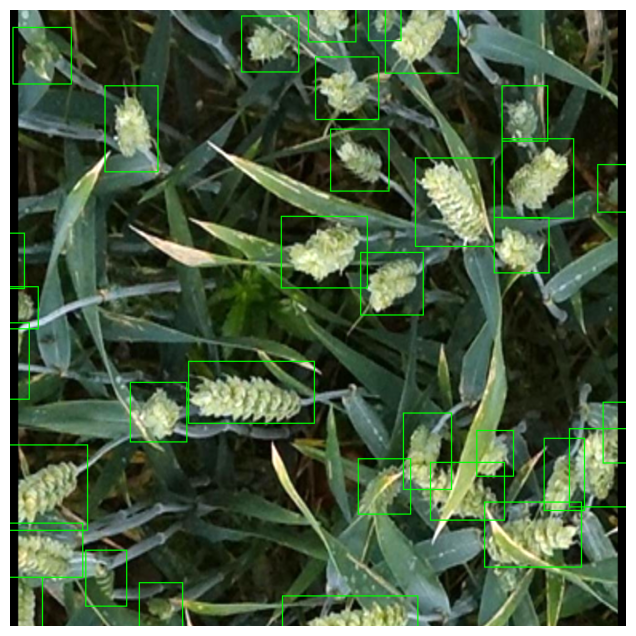

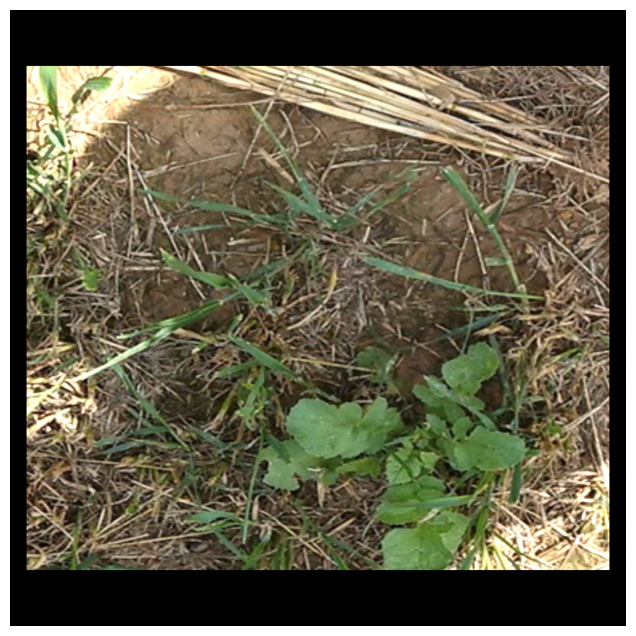

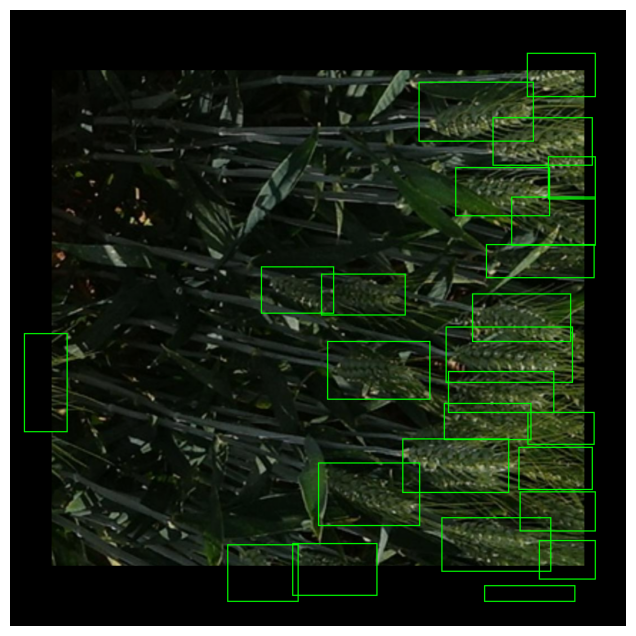

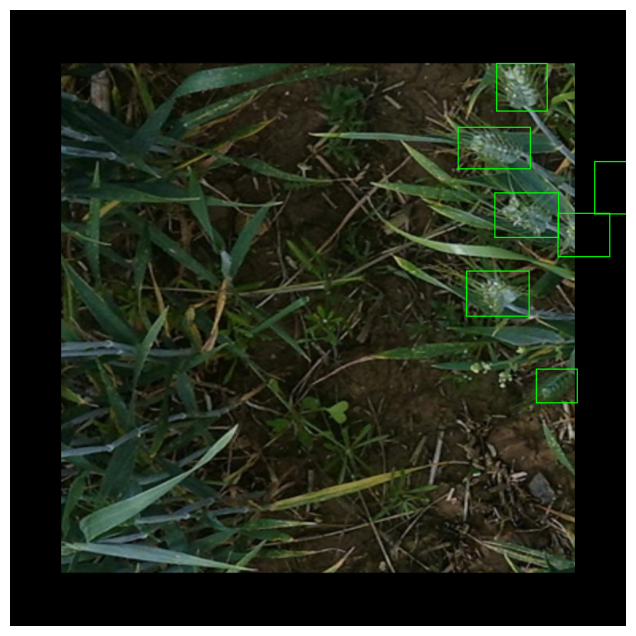

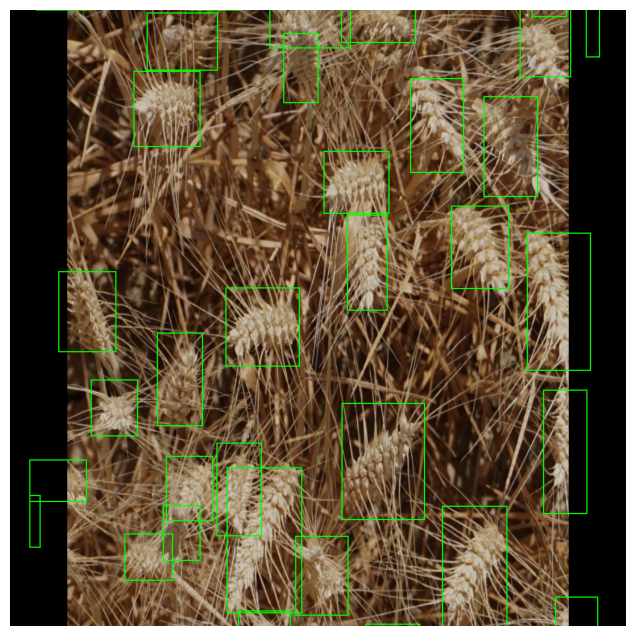

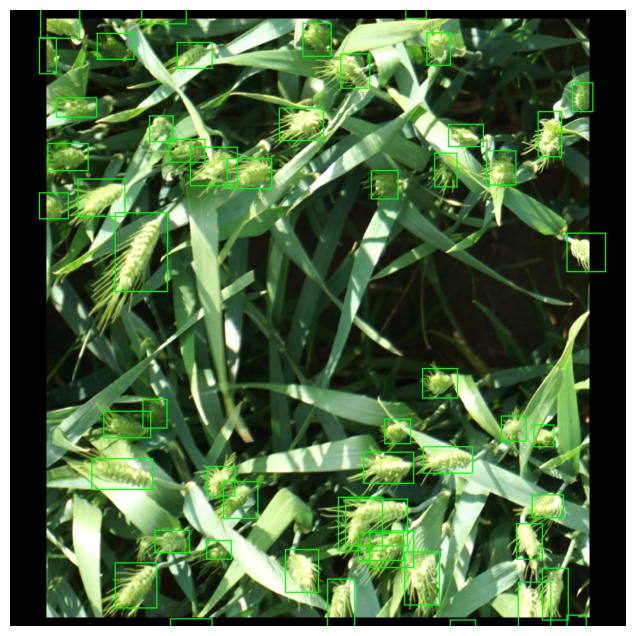

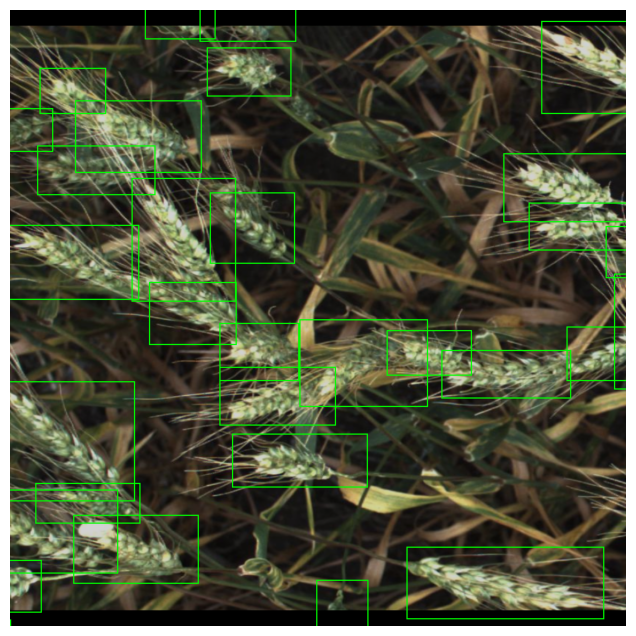

In [24]:
# Visualization code as before...
for image_aug, bbs_aug_on_image in zip(images_aug[:10], bbs_aug[:10]):
    image_after_aug = bbs_aug_on_image.draw_on_image(image_aug, size=2)
    # Convert BGR to RGB for matplotlib
    image_after_aug_rgb = cv2.cvtColor(image_after_aug, cv2.COLOR_BGR2RGB)

    # Use matplotlib to display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(image_after_aug_rgb)
    plt.axis('off')  # Hide the axes
    plt.show()


In [25]:
grouped



augmented_df = pd.DataFrame(columns=['image_id', 'bbox'])
augmented_df['image_id'] = images_aug
augmented_df['bbox'] = bbs_aug

augmented_df

,image_id,bbox
0,"[[[35, 68, 82], [33, 69, 83], [21, 60, 75], [7...","(BoundingBox(x1=1147.1379, y1=672.2433, x2=119..."
1,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","(BoundingBox(x1=798.3658, y1=896.2560, x2=929...."
2,"[[[10, 15, 14], [10, 15, 14], [9, 15, 13], [8,...","(BoundingBox(x1=408.9240, y1=-132.6123, x2=523..."
3,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","(BoundingBox(x1=818.2516, y1=214.1741, x2=935...."
4,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...",()
...,...,...
2995,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","(BoundingBox(x1=775.4869, y1=50.5788, x2=870.4..."
2996,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","(BoundingBox(x1=471.2598, y1=253.0371, x2=559...."
2997,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","(BoundingBox(x1=49.4310, y1=144.7690, x2=194.1..."
2998,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","(BoundingBox(x1=487.5420, y1=534.0421, x2=631...."


In [26]:
# Function to convert BoundingBox to list format [x, y, w, h]
def bbox_to_list(bbox):
    return [bbox.x1, bbox.y1, bbox.x2 - bbox.x1, bbox.y2 - bbox.y1]

# Convert all BoundingBox objects in augmented_df to lists
augmented_df['bbox'] = augmented_df['bbox'].apply(lambda bboxes: [bbox_to_list(bbox) for bbox in bboxes])



In [27]:
augmented_df

,image_id,bbox
0,"[[[35, 68, 82], [33, 69, 83], [21, 60, 75], [7...","[[1147.138, 672.24335, 46.2146, 144.02454], [1..."
1,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[798.3658, 896.25604, 130.78113, 83.625916], ..."
2,"[[[10, 15, 14], [10, 15, 14], [9, 15, 13], [8,...","[[408.92404, -132.61227, 114.789154, 44.79931]..."
3,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[818.25165, 214.17412, 117.30994, 130.87215],..."
4,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...",[]
...,...,...
2995,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[775.4869, 50.578766, 94.9953, 82.8074], [883..."
2996,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[471.2598, 253.03711, 87.81778, 132.30182], [..."
2997,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[49.430992, 144.76895, 144.74948, 116.17154],..."
2998,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[487.54196, 534.0421, 143.75333, 125.23932], ..."


In [28]:

#img = augmented_df['image_id'][0]
#same_image_boxes = augmented_df['bbox'][0]
#for i in same_image_boxes:
#    x,y,w,h = map(int, i)
#    cv2.rectangle(img, (x,y), (x+w,y+h), (255,0,0), 2)
#    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#    plt.imshow(image_rgb)

#plt.show()

### Coverting Trained images into numpy arrays

In [29]:

temp_train_df = grouped
for i, row in grouped.iterrows():
    image_path = os.path.join(train_path, row['image_id'] + '.jpg')  # Construct the full path to the image file
    image = cv2.imread(image_path)  # Load the image with OpenCV

    if image is not None:
        # Replace the 'image_id' with the numpy array of the image
        temp_train_df.at[i, 'image_id'] = image
    else:
        print(f"Image at {image_path} could not be loaded.")

temp_train_df


,image_id,bbox
0,"[[[144, 237, 236], [142, 235, 234], [140, 232,...","[[0, 654, 37, 111], [0, 817, 135, 98], [0, 192..."
1,"[[[105, 115, 92], [104, 117, 93], [98, 114, 90...","[[765.0, 879.0, 116.0, 79.0], [84.0, 539.0, 15..."
2,"[[[31, 49, 50], [32, 50, 51], [34, 52, 53], [3...","[[437.0, 988.0, 98.0, 36.0], [309.0, 527.0, 11..."
3,"[[[28, 40, 40], [26, 38, 38], [14, 26, 26], [0...","[[89.0, 256.0, 113.0, 107.0], [216.0, 282.0, 1..."
4,"[[[50, 59, 69], [47, 56, 66], [44, 53, 63], [4...",[]
...,...,...
3417,"[[[6, 33, 29], [8, 35, 31], [14, 38, 36], [19,...",[]
3418,"[[[70, 103, 118], [72, 105, 120], [62, 94, 107...","[[0, 697, 21, 58], [104, 750, 77, 75], [65, 84..."
3419,"[[[52, 125, 147], [31, 106, 128], [18, 99, 120...","[[256.0, 0.0, 64.0, 99.0], [390.0, 0.0, 48.0, ..."
3420,"[[[147, 240, 219], [138, 231, 210], [139, 228,...","[[447.0, 976.0, 78.0, 48.0], [18.0, 141.0, 218..."


## Combine both Training and Augmented images with bounding boxes

In [30]:
final_df = pd.concat([temp_train_df, augmented_df], ignore_index=True)

In [31]:
final_df

,image_id,bbox
0,"[[[144, 237, 236], [142, 235, 234], [140, 232,...","[[0, 654, 37, 111], [0, 817, 135, 98], [0, 192..."
1,"[[[105, 115, 92], [104, 117, 93], [98, 114, 90...","[[765.0, 879.0, 116.0, 79.0], [84.0, 539.0, 15..."
2,"[[[31, 49, 50], [32, 50, 51], [34, 52, 53], [3...","[[437.0, 988.0, 98.0, 36.0], [309.0, 527.0, 11..."
3,"[[[28, 40, 40], [26, 38, 38], [14, 26, 26], [0...","[[89.0, 256.0, 113.0, 107.0], [216.0, 282.0, 1..."
4,"[[[50, 59, 69], [47, 56, 66], [44, 53, 63], [4...",[]
...,...,...
6417,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[775.4869, 50.578766, 94.9953, 82.8074], [883..."
6418,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[471.2598, 253.03711, 87.81778, 132.30182], [..."
6419,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[49.430992, 144.76895, 144.74948, 116.17154],..."
6420,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[487.54196, 534.0421, 143.75333, 125.23932], ..."


In [32]:
import os
import pandas as pd
import numpy as np
import re
from PIL import Image

def ensure_directory_exists(path):
    """Ensure the directory exists, and if not, create it."""
    if not os.path.exists(path):
        os.makedirs(path)

def parse_image_data(image_data):
    """Parse the image data which could be in string or numpy array format."""
    if isinstance(image_data, str):
        image_str = image_data.strip('[]').replace('\n', '')
        numbers = re.findall(r'\d+', image_str)
        if not numbers:
            print(f"No numbers found in data: {image_data}")
            return None
        try:
            image_array = np.array(numbers, dtype=np.uint8)
            # Check if the length of the array is appropriate for an image
            if len(image_array) % 3 != 0 or len(image_array) < 3072:  # Assuming at least a 32x32 RGB image
                print(f"Incorrect number of pixels: {len(image_array)}")
                return None
            image_array = image_array.reshape((-1, 1024, 3))  # Assuming width is known
        except ValueError as e:
            print(f"Cannot reshape array: {e}. Data: {numbers}")
            return None
    elif isinstance(image_data, np.ndarray) and image_data.ndim == 1 and len(image_data) >= 3072:
        try:
            image_array = image_data.reshape((-1, 1024, 3))  # Modify as necessary
        except ValueError as e:
            print(f"Cannot reshape provided numpy array: {e}")
            return None
    else:
        print(f"Unsupported data type or insufficient data: {image_data}")
        return None
    return image_array

def convert_save_and_update_images(dataframe, file_path):
    ensure_directory_exists(file_path)  # Check and create directory if not exists
    for index, row in dataframe.iterrows():
        image_array = parse_image_data(row['image_id'])
        if image_array is None:
            print(f"Skipping row {index} due to invalid image data.")
            continue
        try:
            if image_array.ndim != 3 or image_array.shape[2] != 3:
                print(f"Image data at row {index} has incorrect shape or dimension: {image_array.shape}")
                continue
            image = Image.fromarray(image_array, 'RGB')
            file_name = f'image_{index}.png'
            image.save(os.path.join(file_path, file_name))
            dataframe.at[index, 'image_id'] = file_name
            dataframe.at[index, 'image_dimensions'] = str(image_array.shape)
        except Exception as e:
            print(f"Error processing row {index}: {e}")


    return dataframe

# Example usage
df = final_df.copy()
df_updated = convert_save_and_update_images(df, '/path_to_save_images')
df_updated.to_csv('path_to_save_updated_csv.csv', index=False)


Streaming output truncated to the last 5000 lines.
Unsupported data type or insufficient data: [[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]
Skipping row 6322 due to invalid image data.
Unsupported data type or insufficient data: [[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]


In [33]:
df_updated

,image_id,bbox
0,"[[[144, 237, 236], [142, 235, 234], [140, 232,...","[[0, 654, 37, 111], [0, 817, 135, 98], [0, 192..."
1,"[[[105, 115, 92], [104, 117, 93], [98, 114, 90...","[[765.0, 879.0, 116.0, 79.0], [84.0, 539.0, 15..."
2,"[[[31, 49, 50], [32, 50, 51], [34, 52, 53], [3...","[[437.0, 988.0, 98.0, 36.0], [309.0, 527.0, 11..."
3,"[[[28, 40, 40], [26, 38, 38], [14, 26, 26], [0...","[[89.0, 256.0, 113.0, 107.0], [216.0, 282.0, 1..."
4,"[[[50, 59, 69], [47, 56, 66], [44, 53, 63], [4...",[]
...,...,...
6417,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[775.4869, 50.578766, 94.9953, 82.8074], [883..."
6418,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[471.2598, 253.03711, 87.81778, 132.30182], [..."
6419,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[49.430992, 144.76895, 144.74948, 116.17154],..."
6420,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[[487.54196, 534.0421, 143.75333, 125.23932], ..."


In [34]:
!pip install torch torchvision
!git clone https://github.com/facebookresearch/detr.git
%cd detr
!pip install -r requirements.txt


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

In [35]:
import numpy as np
import pandas as pd
import json
import os
from PIL import Image

# Assuming df_updated is already loaded and available
df_train = df_updated[:4000]

# Base directory for DETR dataset
base_dir = '/content/path/to/detr/dataset'
images_dir_train = os.path.join(base_dir, 'train2017')
annotations_dir = os.path.join(base_dir, 'annotations')

# Ensure directories exist
os.makedirs(images_dir_train, exist_ok=True)
os.makedirs(annotations_dir, exist_ok=True)

# COCO JSON structure
coco_format_train = {
    "images": [],
    "annotations": [],
    "categories": [{
        "id": 1,
        "name": "object"
    }]
}

# Initialize an ID for each annotation
annotation_id_train = 0

# Populate the JSON
for idx, row in df_train.iterrows():
    # Directly use the image data if it's already an ndarray
    if isinstance(row['image_id'], np.ndarray):
        image_data = row['image_id']
    else:
        continue  # If it's not an ndarray, skip this row or handle conversion

    image_file_name = f"image_{idx}.png"  # Generate a unique filename based on index

    # Save the image array as an image file
    img = Image.fromarray(image_data.astype('uint8'), 'RGB')
    img.save(os.path.join(images_dir_train, image_file_name))

    # Add the image information to JSON
    coco_format_train['images'].append({
        "id": idx,
        "file_name": image_file_name,
        "height": image_data.shape[0],
        "width": image_data.shape[1]
    })

    # Process each bbox as a separate annotation
    bboxes = eval(row['bbox']) if isinstance(row['bbox'], str) else row['bbox']
    for bbox_str in bboxes:
        bbox = eval(bbox_str.strip("[]")) if isinstance(bbox_str, str) else bbox_str
        bbox = [float(coord) for coord in bbox]
        area = bbox[2] * bbox[3]

        # Append the annotation
        coco_format_train['annotations'].append({
            "id": annotation_id_train,
            "image_id": idx,
            "bbox": bbox,
            "category_id": 1,
            "area": area,
            "iscrowd": 0
        })
        annotation_id_train += 1

# Save COCO JSON
coco_json_path_train = os.path.join(annotations_dir, 'instances_train2017.json')
with open(coco_json_path_train, 'w') as json_file:
    json.dump(coco_format_train, json_file)

print("Training Dataset prepared for DETR.")


Training Dataset prepared for DETR.


In [36]:

images_dir_val = os.path.join(base_dir, 'val2017')
os.makedirs(images_dir_val, exist_ok=True)

df_valid = df_updated[4100:]
annotation_id_valid = 0

# COCO JSON structure
coco_format_valid = {
    "images": [],
    "annotations": [],
    "categories": [{
        "id": 1,
        "name": "object"
    }]
}

for idx, row in df_valid.iterrows():
    # Directly use the image data if it's already an ndarray
    if isinstance(row['image_id'], np.ndarray):
        image_data = row['image_id']
    else:
        continue  # If it's not an ndarray, skip this row or handle conversion

    image_file_name = f"image_{idx}.png"  # Generate a unique filename based on index

    # Save the image array as an image file
    img = Image.fromarray(image_data.astype('uint8'), 'RGB')
    img.save(os.path.join(images_dir_val, image_file_name))

    # Add the image information to JSON
    coco_format_valid['images'].append({
        "id": idx,
        "file_name": image_file_name,
        "height": image_data.shape[0],
        "width": image_data.shape[1]
    })

    # Process each bbox as a separate annotation
    bboxes = eval(row['bbox']) if isinstance(row['bbox'], str) else row['bbox']
    for bbox_str in bboxes:
        bbox = eval(bbox_str.strip("[]")) if isinstance(bbox_str, str) else bbox_str
        bbox = [float(coord) for coord in bbox]
        area = bbox[2] * bbox[3]

        # Append the annotation
        coco_format_valid['annotations'].append({
            "id": annotation_id_valid,
            "image_id": idx,
            "bbox": bbox,
            "category_id": 1,
            "area": area,
            "iscrowd": 0
        })
        annotation_id_valid += 1

# Save COCO JSON
coco_json_path_valid = os.path.join(annotations_dir, 'instances_val2017.json')
with open(coco_json_path_valid, 'w') as json_file:
    json.dump(coco_format_valid, json_file)

print("Validation Dataset prepared for DETR.")

Validation Dataset prepared for DETR.


In [37]:
!pip install --upgrade pycocotools


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully uninstalled pycocotools-2.0


In [38]:

import torch
torch.cuda.set_device(0)
!torchrun --nproc_per_node=1 main.py --coco_path /content/path/to/detr/dataset/ --batch_size 2 --no_aux_loss --epochs 1 > /content/training_log.txt 2>&1


In [39]:
%load_ext tensorboard


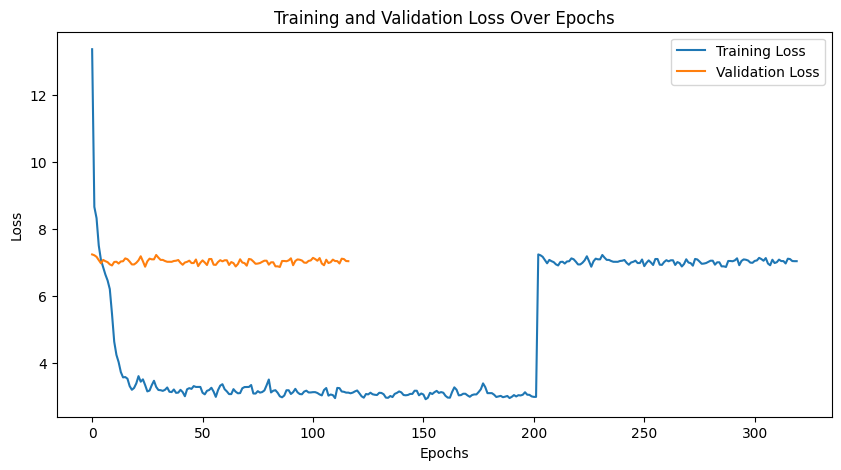

In [40]:
import re
import matplotlib.pyplot as plt

# Initialize lists to hold the parsed losses
train_losses, val_losses = [], []
accuracies = []
training_metrics, validation_metrics = [],[]

# Regular expression patterns for losses
pattern_train_loss = re.compile(r"loss: (\d+\.\d+) \(.*\)")  # adjust this pattern to match your log format
pattern_val_loss = re.compile(r"Test: .* loss: (\d+\.\d+)")  # adjust this pattern to match your log format
pattern_accuracy = re.compile(r'Accuracy: (\d+\.\d+)')

# Process the log file
with open('/content/training_log.txt', 'r') as file:
    for line in file:
        # Search for training loss
        match_accuracy = pattern_accuracy.search(line)
        if match_accuracy:
            accuracies.append(float(match_accuracy.group(1)))
        match_train = pattern_train_loss.search(line)
        if match_train:
            train_losses.append(float(match_train.group(1)))
            training_metrics.append(float(match_train.group(1)))


        # Search for validation loss
        match_val = pattern_val_loss.search(line)
        if match_val:
            val_losses.append(float(match_val.group(1)))
            validation_metrics.append(float(match_val.group(1)))

# Plot the training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.show()


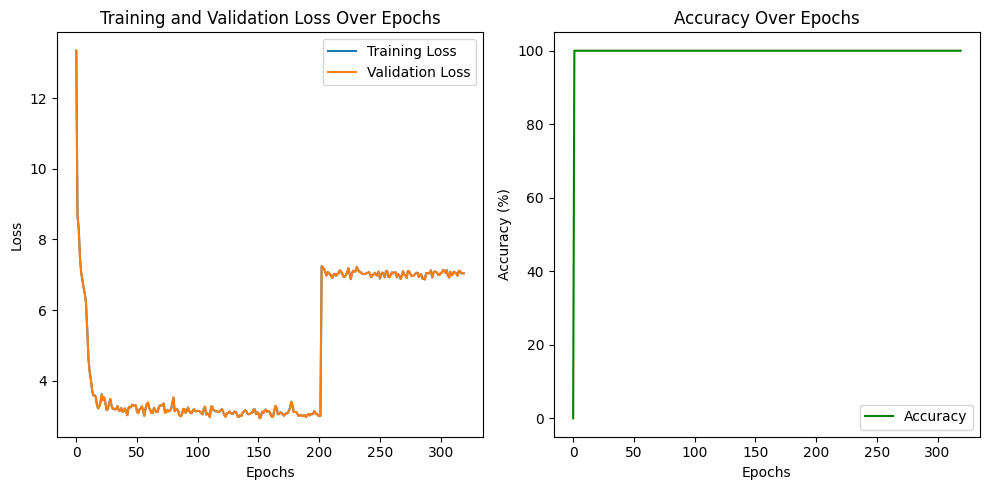

In [41]:
import re
import matplotlib.pyplot as plt

# Initialize lists to hold the parsed losses
train_losses, val_losses = [], []
accuracies = []

# Regular expression patterns for training and validation losses
pattern_train_loss = re.compile(r"loss: (\d+\.\d+) \(")  # Adjust this pattern to match your log format for training loss
pattern_val_loss = re.compile(r"loss: (\d+\.\d+) \(")  # Adjust this pattern to match your log format for validation loss
pattern_accuracy = re.compile(r'class_error_unscaled: (\d+\.\d+)')  # Adjust this pattern to match class error as accuracy

# Process the log file
with open('/content/training_log.txt', 'r') as file:
    for line in file:
        # Search for accuracies
        match_accuracy = pattern_accuracy.search(line)
        if match_accuracy:
            accuracies.append(100 - float(match_accuracy.group(1)))  # Calculating accuracy as 100 - class_error

        # Search for training loss
        match_train = pattern_train_loss.search(line)
        if match_train:
            train_losses.append(float(match_train.group(1)))

        # Search for validation loss
        match_val = pattern_val_loss.search(line)
        if match_val:
            val_losses.append(float(match_val.group(1)))

# Plot the training and validation losses
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)  # First subplot for losses
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()

plt.subplot(1, 2, 2)  # Second subplot for accuracies
plt.plot(accuracies, label='Accuracy', color='green')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()
